In [191]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import sqlite3
warnings.filterwarnings("ignore")

In [192]:
df = pd.read_csv('mental_health_monitoring_dataset.csv')

This dataset provides comprehensive hourly monitoring data of logistics drivers in Texas, focusing on various physiological, psychological, and contextual features that impact their mental health. Collected from January 1, 2017, to June 31, 2024, this dataset encompasses 400,000 records, allowing for in-depth analysis and modeling of factors influencing driver well-being. The data can be utilized to develop predictive models for assessing mental health outcomes, enabling targeted interventions and support systems.

In [193]:
df.head()

,Timestamp,Heart_Rate,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Skin_Temperature,Galvanic_Skin_Response,Respiration_Rate,Sleep_Duration,Activity_Levels,Mood,...,Fuel_Consumption,Average_Speed,Work_Hours,Job_Stressors,Location_Latitude,Location_Longitude,Stress_Level,Mental_Health_History,Resilience_Factors,Mental_Health_Status
0,1/1/2019 0:00,98.0,177.0,99.0,36.854833,0.603660,20.0,4.0,4945.0,Happy,...,17.568925,78.0,12.0,5.0,51.002436,44.895265,Low,Yes,5.0,Normal
1,1/1/2019 1:00,111.0,133.0,86.0,37.239401,0.934820,24.0,5.0,6221.0,Happy,...,10.295241,25.0,8.0,9.0,42.839887,75.276677,Low,No,2.0,Moderate Stress
2,1/1/2019 2:00,88.0,154.0,113.0,36.209588,0.035483,28.0,1.0,6426.0,Anxious,...,8.515171,37.0,15.0,9.0,68.836584,20.795174,Low,No,4.0,Depression
3,1/1/2019 3:00,74.0,162.0,60.0,36.087569,0.653249,25.0,4.0,14435.0,Happy,...,13.774633,39.0,15.0,5.0,51.752928,89.835756,Low,No,1.0,Normal
4,1/1/2019 4:00,102.0,160.0,81.0,36.593949,0.756138,15.0,6.0,4334.0,Happy,...,18.747632,87.0,11.0,1.0,98.613250,86.654677,Low,No,2.0,Moderate Stress


In [194]:
stress_mapping = {'Low': 1, 'Medium': 2, 'High': 3}
df['Stress_Level'] = df['Stress_Level'].map(stress_mapping)

In [195]:
cols = ['Mental_Health_History']
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df[cols] = df[cols].apply(le.fit_transform)
df.head()


,Timestamp,Heart_Rate,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Skin_Temperature,Galvanic_Skin_Response,Respiration_Rate,Sleep_Duration,Activity_Levels,Mood,...,Fuel_Consumption,Average_Speed,Work_Hours,Job_Stressors,Location_Latitude,Location_Longitude,Stress_Level,Mental_Health_History,Resilience_Factors,Mental_Health_Status
0,1/1/2019 0:00,98.0,177.0,99.0,36.854833,0.603660,20.0,4.0,4945.0,Happy,...,17.568925,78.0,12.0,5.0,51.002436,44.895265,1.0,1,5.0,Normal
1,1/1/2019 1:00,111.0,133.0,86.0,37.239401,0.934820,24.0,5.0,6221.0,Happy,...,10.295241,25.0,8.0,9.0,42.839887,75.276677,1.0,0,2.0,Moderate Stress
2,1/1/2019 2:00,88.0,154.0,113.0,36.209588,0.035483,28.0,1.0,6426.0,Anxious,...,8.515171,37.0,15.0,9.0,68.836584,20.795174,1.0,0,4.0,Depression
3,1/1/2019 3:00,74.0,162.0,60.0,36.087569,0.653249,25.0,4.0,14435.0,Happy,...,13.774633,39.0,15.0,5.0,51.752928,89.835756,1.0,0,1.0,Normal
4,1/1/2019 4:00,102.0,160.0,81.0,36.593949,0.756138,15.0,6.0,4334.0,Happy,...,18.747632,87.0,11.0,1.0,98.613250,86.654677,1.0,0,2.0,Moderate Stress


In [196]:
df.tail()

,Timestamp,Heart_Rate,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Skin_Temperature,Galvanic_Skin_Response,Respiration_Rate,Sleep_Duration,Activity_Levels,Mood,...,Fuel_Consumption,Average_Speed,Work_Hours,Job_Stressors,Location_Latitude,Location_Longitude,Stress_Level,Mental_Health_History,Resilience_Factors,Mental_Health_Status
46747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN
46748,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN
46749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN
46750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN
46751,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN


In [197]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46752 entries, 0 to 46751
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Timestamp                 43823 non-null  object 
 1   Heart_Rate                43823 non-null  float64
 2   Blood_Pressure_Systolic   43823 non-null  float64
 3   Blood_Pressure_Diastolic  43823 non-null  float64
 4   Skin_Temperature          43823 non-null  float64
 5   Galvanic_Skin_Response    43823 non-null  float64
 6   Respiration_Rate          43823 non-null  float64
 7   Sleep_Duration            43823 non-null  float64
 8   Activity_Levels           43823 non-null  float64
 9   Mood                      43823 non-null  object 
 10  Cognitive_Load            43823 non-null  float64
 11  Social_Interaction        43823 non-null  float64
 12  Driving_Conditions        43823 non-null  object 
 13  Route_Duration            43823 non-null  float64
 14  Fuel_C

In [198]:
df.isnull().sum()

Timestamp                   2929
Heart_Rate                  2929
Blood_Pressure_Systolic     2929
Blood_Pressure_Diastolic    2929
Skin_Temperature            2929
Galvanic_Skin_Response      2929
Respiration_Rate            2929
Sleep_Duration              2929
Activity_Levels             2929
Mood                        2929
Cognitive_Load              2929
Social_Interaction          2929
Driving_Conditions          2929
Route_Duration              2929
Fuel_Consumption            2929
Average_Speed               2929
Work_Hours                  2929
Job_Stressors               2929
Location_Latitude           2929
Location_Longitude          2929
Stress_Level                2929
Mental_Health_History          0
Resilience_Factors          2929
Mental_Health_Status        2929
dtype: int64

In [199]:
df = df.dropna()

In [200]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%m/%d/%Y %H:%M')

# With:

Timestamp: The date and time when the data was recorded (hourly granularity).

Heart_Rate: Average heart rate of the driver (bpm).

Blood_Pressure_Systolic: Systolic blood pressure measurements (mmHg).

Blood_Pressure_Diastolic: Diastolic blood pressure measurements (mmHg).

Skin_Temperature: Average skin temperature readings (°C).

Galvanic_Skin_Response: Measurement of sweat gland activity indicating stress levels (unitless).

Respiration_Rate: Average breaths per minute.

Sleep_Duration: Total sleep time recorded in hours.

Activity_Levels: Number of steps taken by the driver (count).

Mood: Self-reported mood of the driver (categorical: Happy, Sad, Anxious, Irritable, Neutral).

Cognitive_Load: Assessment score of the driver's cognitive load (1 to 10 scale).

Social_Interaction: Frequency of social interactions (number of interactions).

Driving_Conditions: Quality of driving conditions (categorical: Good, Moderate, Poor).

Route_Duration: Duration of the driving route (hours).

Fuel_Consumption: Average fuel consumption during the drive (L/100km).

Average_Speed: Average speed of the vehicle (km/h).

Work_Hours: Total hours worked by the driver (hours).

Job_Stressors: Score reflecting the level of job-related stress (1 to 10 scale).

Location_Latitude: GPS latitude of the driver's location.

Location_Longitude: GPS longitude of the driver's location.

Stress_Level: Categorical representation of the driver's stress level (Low, Medium, High).

Mental_Health_History: History of mental health issues (categorical: Yes, No).

Resilience_Factors: Score indicating the driver's resilience (1 to 10 scale).

Mental_Health_Status: Target variable indicating the driver's mental health status (Normal, Mild Stress, Moderate Stress, Severe Stress, Anxiety, Depression).

#

# SQL Analysis

In [201]:
df.columns

Index(['Timestamp', 'Heart_Rate', 'Blood_Pressure_Systolic',
       'Blood_Pressure_Diastolic', 'Skin_Temperature',
       'Galvanic_Skin_Response', 'Respiration_Rate', 'Sleep_Duration',
       'Activity_Levels', 'Mood', 'Cognitive_Load', 'Social_Interaction',
       'Driving_Conditions', 'Route_Duration', 'Fuel_Consumption',
       'Average_Speed', 'Work_Hours', 'Job_Stressors', 'Location_Latitude',
       'Location_Longitude', 'Stress_Level', 'Mental_Health_History',
       'Resilience_Factors', 'Mental_Health_Status'],
      dtype='object')

In [202]:
con = sqlite3.connect('MentalSensor.db')

In [203]:
%load_ext sql

The sql extension is already loaded. To reload it, use:
  %reload_ext sql


In [204]:
%sql sqlite:///MentalSensor.db

In [205]:
df.to_sql('MentalSensor',con,if_exists = 'replace',index = False)

43823

## Analyze High Stress Periods During the Day

In [206]:
%%sql

SELECT 
    Heart_Rate, Blood_Pressure_Systolic, Blood_Pressure_Diastolic, 
    Skin_Temperature, Galvanic_Skin_Response, Respiration_Rate, 
    Stress_Level, Activity_Levels, 
    Timestamp
FROM 
    MentalSensor 
WHERE 
    Stress_Level = 3  -- assuming 3 represents "High"
ORDER BY 
    Timestamp


 * sqlite:///MentalSensor.db
Done.


Heart_Rate,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Skin_Temperature,Galvanic_Skin_Response,Respiration_Rate,Stress_Level,Activity_Levels,Timestamp
117.0,131.0,119.0,37.34368478,0.247614551,13.0,3.0,18520.0,2019-01-01 08:00:00
82.0,114.0,71.0,37.32080448,0.513168892,28.0,3.0,12728.0,2019-01-01 10:00:00
103.0,177.0,110.0,36.87811637,0.448190752,20.0,3.0,2122.0,2019-01-01 23:00:00
86.0,138.0,92.0,36.34217831,0.090387904,20.0,3.0,10954.0,2019-01-02 12:00:00
101.0,96.0,64.0,37.30154331,0.626439731,24.0,3.0,3305.0,2019-01-02 14:00:00
119.0,132.0,110.0,35.95031852,0.91289152,24.0,3.0,1942.0,2019-01-02 16:00:00
106.0,138.0,84.0,36.32394517,0.711251636,24.0,3.0,5491.0,2019-01-02 19:00:00
96.0,174.0,117.0,36.58339025,0.902621037,12.0,3.0,8466.0,2019-01-03 02:00:00
98.0,116.0,105.0,36.60924271,0.117727994,22.0,3.0,5462.0,2019-01-03 07:00:00
73.0,147.0,78.0,35.97139186,0.190315226,22.0,3.0,13049.0,2019-01-04 04:00:00


### Average Stress Level by Hour of Day

In [207]:
%%sql 

SELECT 
    strftime('%H', Timestamp) AS Hour, 
    AVG(Stress_Level) AS avg_stress_level
FROM 
    MentalSensor
GROUP BY 
    Hour
ORDER BY 
    Hour;



 * sqlite:///MentalSensor.db
Done.


Hour,avg_stress_level
00,1.717962760131435
01,1.7185104052573932
02,1.6648411829134722
03,1.7157721796276013
04,1.7070098576122672
05,1.7267250821467688
06,1.7146768893756845
07,1.7146768893756845
08,1.706462212486309
09,1.676341730558598


In [208]:
%%sql

SELECT 
    Hour,
    avg_stress_level
FROM (
    SELECT 
        strftime('%H', Timestamp) AS Hour, 
        AVG(Stress_Level) AS avg_stress_level
    FROM 
        MentalSensor
    GROUP BY 
        strftime('%H', Timestamp)
) AS hourly_avg
ORDER BY 
    avg_stress_level DESC
LIMIT 1;


 * sqlite:///MentalSensor.db
Done.


Hour,avg_stress_level
22,1.7365826944140197


### Trend of Physiological Indicators Throughout the Day

In [209]:
%%sql

SELECT 
    Timestamp,
    AVG(Heart_Rate) AS avg_heart_rate,
    AVG(Blood_Pressure_Systolic) AS avg_systolic_bp,
    AVG(Blood_Pressure_Diastolic) AS avg_diastolic_bp,
    AVG(Skin_Temperature) AS avg_skin_temp
FROM 
    MentalSensor
GROUP BY 
    Timestamp
ORDER BY 
    Timestamp;


 * sqlite:///MentalSensor.db
Done.


Timestamp,avg_heart_rate,avg_systolic_bp,avg_diastolic_bp,avg_skin_temp
2019-01-01 00:00:00,98.0,177.0,99.0,36.85483318
2019-01-01 01:00:00,111.0,133.0,86.0,37.23940082
2019-01-01 02:00:00,88.0,154.0,113.0,36.20958756
2019-01-01 03:00:00,74.0,162.0,60.0,36.08756893
2019-01-01 04:00:00,102.0,160.0,81.0,36.5939485
2019-01-01 05:00:00,67.0,158.0,67.0,36.24652999
2019-01-01 06:00:00,80.0,150.0,64.0,35.26162109
2019-01-01 07:00:00,98.0,119.0,83.0,37.16349192
2019-01-01 08:00:00,117.0,131.0,119.0,37.34368478
2019-01-01 09:00:00,78.0,163.0,92.0,37.18326809


### Peak Stress Events by Date

In [1]:
%%sql

SELECT 
    DATE(Timestamp) AS Date,
    COUNT(*) AS high_stress_events
FROM 
    MentalSensor
WHERE 
    Stress_Level = 3
GROUP BY 
    Date
ORDER BY 
    high_stress_events DESC;


UsageError: Cell magic `%%sql` not found.


### Comparing Average Stress Levels on Weekdays vs. Weekends

In [210]:
%%sql

SELECT 
    CASE 
        WHEN strftime('%w', Timestamp) IN ('0', '6') THEN 'Weekend'  -- 0=Sunday, 6=Saturday
        ELSE 'Weekday'
    END AS Day_Type,
    AVG(Stress_Level) AS avg_stress_level
FROM 
    MentalSensor
GROUP BY 
    Day_Type;


 * sqlite:///MentalSensor.db
Done.


Day_Type,avg_stress_level
Weekday,1.701933216168717
Weekend,1.7163952745849298


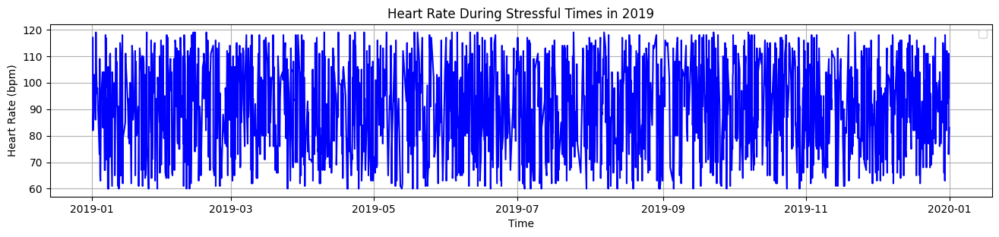

In [211]:
import pandas as pd
import matplotlib.pyplot as plt


year = 2019
df_year = df[df['Timestamp'].dt.year == year]

stressful_times = df_year[df_year['Stress_Level'] == 3]

stressful_times.set_index('Timestamp', inplace=True)

plt.figure(figsize=(16, 10))

# Plot Heart Rate
plt.subplot(3, 1, 1)  # 3 rows, 1 column, 1st subplot
plt.plot(stressful_times.index, stressful_times['Heart_Rate'], color='blue')
plt.title('Heart Rate During Stressful Times in 2019')
plt.xlabel('Time')
plt.ylabel('Heart Rate (bpm)')
plt.grid()
plt.legend()


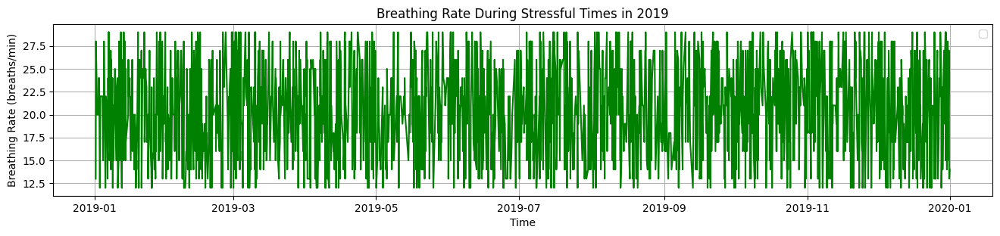

In [212]:
# Plot Breathing Rate
plt.figure(figsize=(16, 10))

plt.subplot(3, 1, 2)  # 3 rows, 1 column, 2nd subplot
plt.plot(stressful_times.index, stressful_times['Respiration_Rate'], color='green')
plt.title('Breathing Rate During Stressful Times in 2019')
plt.xlabel('Time')
plt.ylabel('Breathing Rate (breaths/min)')
plt.grid()
plt.legend()




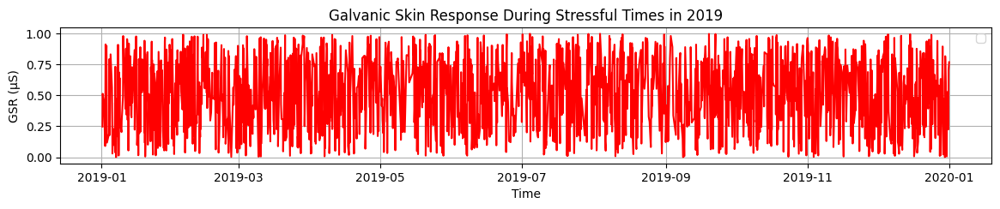

In [213]:

# Plot Galvanic Skin Response (GSR)
plt.figure(figsize=(14, 7))
plt.subplot(3, 1, 3)  # 3 rows, 1 column, 3rd subplot
plt.plot(stressful_times.index, stressful_times['Galvanic_Skin_Response'], color='red')
plt.title('Galvanic Skin Response During Stressful Times in 2019')
plt.xlabel('Time')
plt.ylabel('GSR (μS)')
plt.grid()
plt.legend()

### Aggregate Sleep Duration

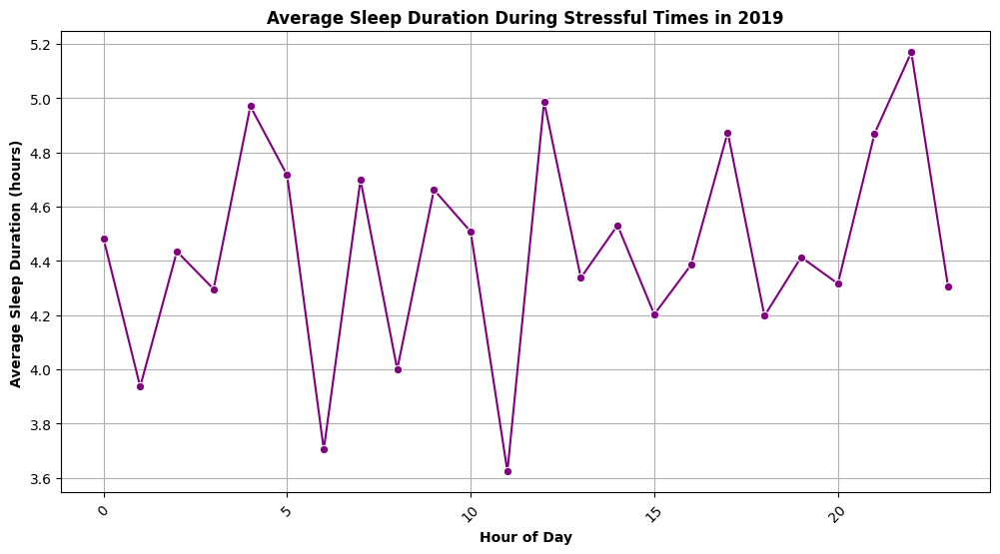

In [217]:
stressful_times = df_year[df_year['Stress_Level'] == 3]

stressful_times['Hour'] = stressful_times['Timestamp'].dt.hour

sleep_analysis = stressful_times.groupby('Hour')['Sleep_Duration'].mean().reset_index(name='Average Sleep Duration')

# Step 2: Create a line plot for Sleep Duration
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Average Sleep Duration', data=sleep_analysis, marker='o', color='purple')

plt.title('Average Sleep Duration During Stressful Times in 2019', weight='bold')
plt.xlabel('Hour of Day', weight='bold')
plt.ylabel('Average Sleep Duration (hours)', weight='bold')
plt.xticks(rotation=45)
plt.grid()
plt.show()




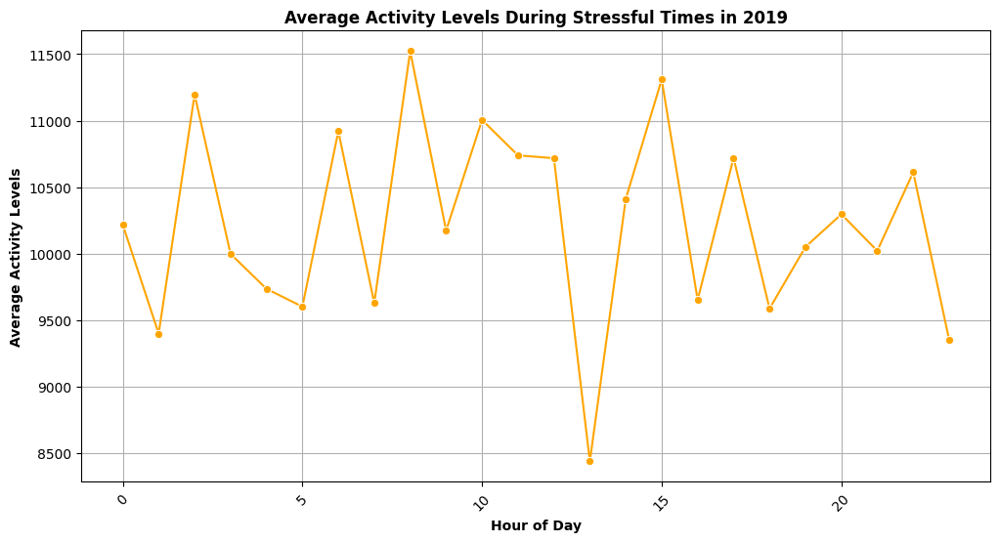

In [218]:
# Aggregate Activity Levels
activity_analysis = stressful_times.groupby('Hour')['Activity_Levels'].mean().reset_index(name='Average Activity Levels')

# Step 4: Create a line plot for Activity Levels
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Average Activity Levels', data=activity_analysis, marker='o', color='orange')

plt.title('Average Activity Levels During Stressful Times in 2019', weight='bold')
plt.xlabel('Hour of Day', weight='bold')
plt.ylabel('Average Activity Levels', weight='bold')
plt.xticks(rotation=45)
plt.grid()
plt.show()

### Analyze Driving Conditions


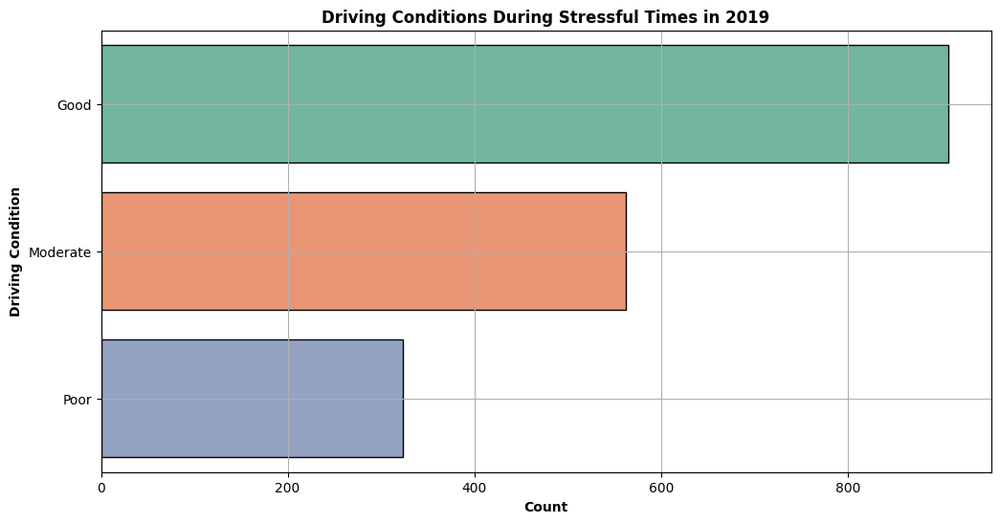

In [219]:
driving_conditions_analysis = stressful_times['Driving_Conditions'].value_counts().reset_index()
driving_conditions_analysis.columns = ['Driving Condition', 'Count']

plt.figure(figsize=(12, 6))
sns.barplot(x='Count', y='Driving Condition', data=driving_conditions_analysis, palette="Set2", edgecolor='black')

plt.title('Driving Conditions During Stressful Times in 2019', weight='bold')
plt.xlabel('Count', weight='bold')
plt.ylabel('Driving Condition', weight='bold')
plt.grid()
plt.show()


In [ ]:
df['Mood'].unique()

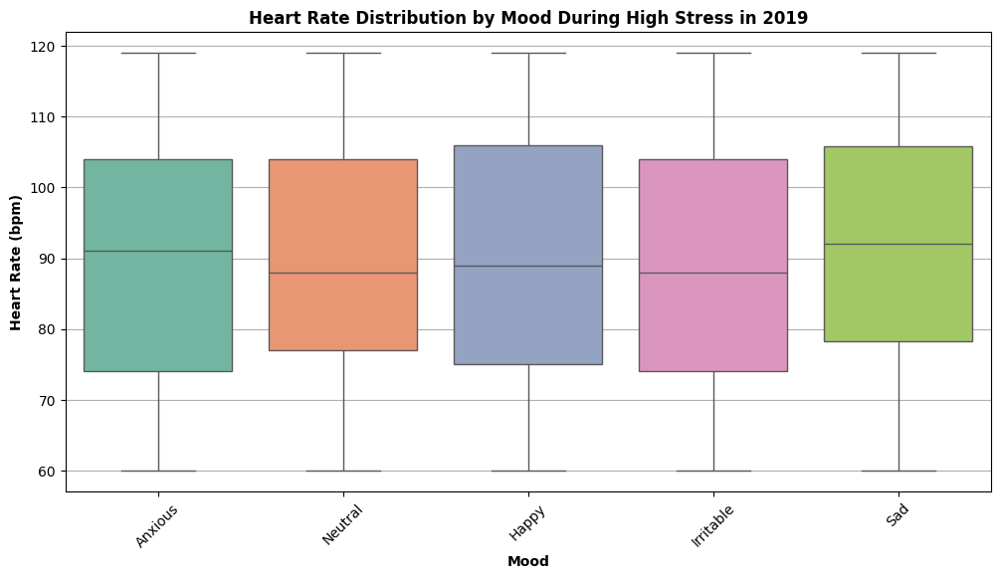

In [220]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Mood', y='Heart_Rate', data=stressful_times, palette="Set2")

plt.title('Heart Rate Distribution by Mood During High Stress in 2019', weight='bold')
plt.xlabel('Mood', weight='bold')
plt.ylabel('Heart Rate (bpm)', weight='bold')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


### Mood Distribution

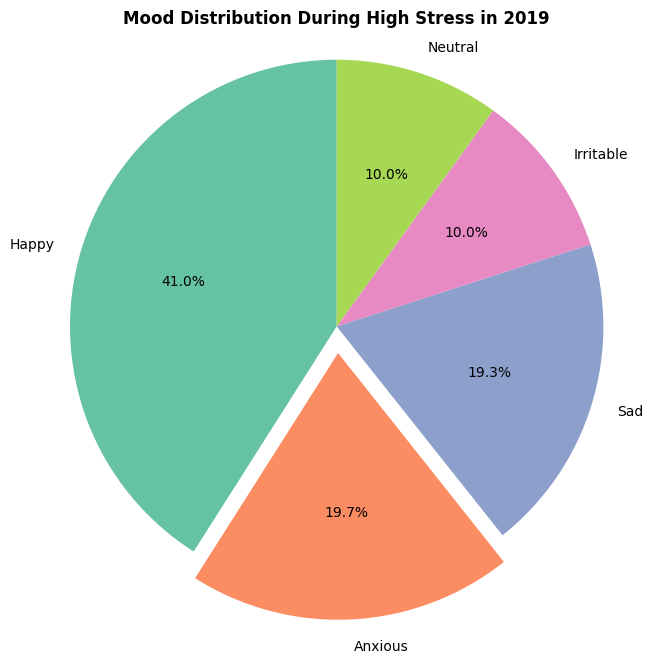

In [221]:
plt.figure(figsize=(8, 8))
explode = (0, 0.1, 0, 0, 0) 
plt.pie(mood_counts['Count'], labels=mood_counts['Mood'], autopct='%1.1f%%', 
         startangle=90, colors=sns.color_palette("Set2"), explode=explode)

plt.title('Mood Distribution During High Stress in 2019', weight='bold')
plt.axis('equal')  
plt.show()


In [ ]:
#Model
df.isnull().sum()

In [ ]:
df = df.dropna()

[[2084 1311  927]
 [1347  766  557]
 [ 833  552  388]]
              precision    recall  f1-score   support

           1       0.49      0.48      0.49      4322
           2       0.29      0.29      0.29      2670
           3       0.21      0.22      0.21      1773

    accuracy                           0.37      8765
   macro avg       0.33      0.33      0.33      8765
weighted avg       0.37      0.37      0.37      8765



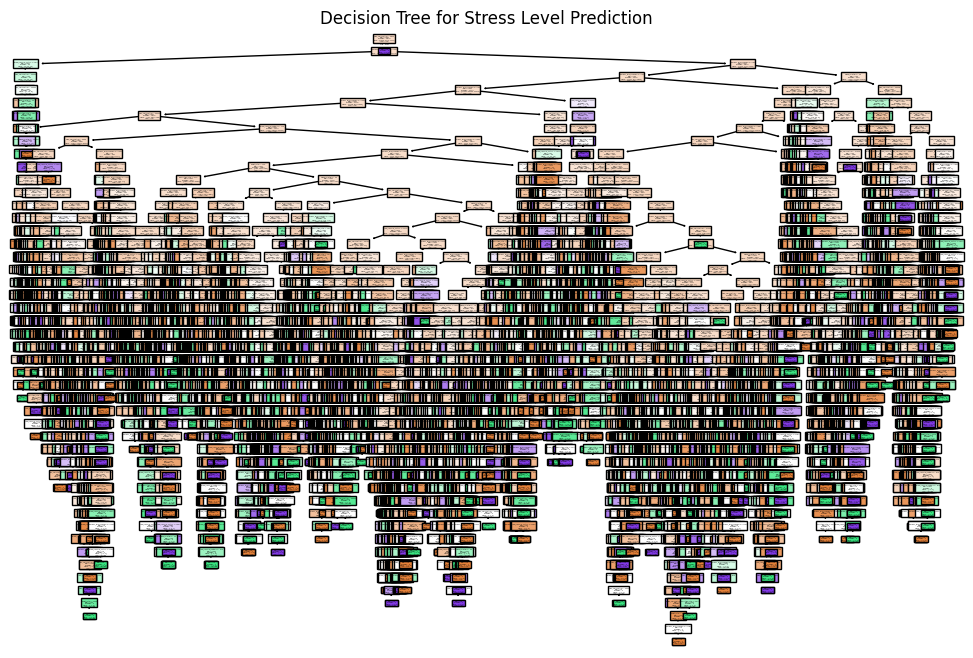

In [244]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

df = pd.read_csv('mental_health_monitoring_dataset.csv')
df = df.dropna()
features = ['Heart_Rate', 'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic',
            'Skin_Temperature', 'Galvanic_Skin_Response', 'Respiration_Rate',
            'Sleep_Duration']

target = 'Stress_Level'

df[target] = df[target].map({'Low': 1, 'Medium': 2, 'High': 3})

X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

plt.figure(figsize=(12, 8))
plot_tree(model, feature_names=features, class_names=['Low', 'Medium', 'High'], filled=True)
plt.title('Decision Tree for Stress Level Prediction')
plt.show()
